# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [7]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress


## 1.1 Reading Data

In [0]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [9]:
print(project_data.shape)
project_data.head(1)

(109248, 17)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0


In [10]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [11]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [12]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [0]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

# join two dataframes in python: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.merge.html#pandas-dataframe-merge
project_data = pd.merge(project_data, price_data, on='id', how='left')


In [14]:
print(project_data.shape)
project_data.head(1)

(109248, 19)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,725.05,4


## 1.2 preprocessing of `project_subject_categories`

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.4 Text preprocessing

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [18]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,725.05,4,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,213.03,8,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


In [19]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[10000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement these kits: magnets, motion, si

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [21]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

\"A person is a person, no matter how small.\" (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed. \r\nStudents in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.\r\nOur school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the ear

In [22]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

 A person is a person, no matter how small.  (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed.   Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.  Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the early chi

In [23]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

 A person is a person no matter how small Dr Seuss I teach the smallest students with the biggest enthusiasm for learning My students learn in many different ways using all of our senses and multiple intelligences I use a wide range of techniques to help all my students succeed Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures including Native Americans Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom Kindergarteners in my class love to work with hands on materials and have many different opportunities to practice a skill before it is mastered Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum Montana is the perfect place to learn about agriculture and nutrition My students love to role play in our pretend kitchen in the early childhood classroom

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

__essay preprocessing__

In [25]:
# Combining all the above stundents 
from tqdm import tqdm
essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    essays.append(sent.lower().strip())

100%|██████████| 109248/109248 [01:11<00:00, 1529.92it/s]


In [26]:
# after preprocesing
essays[20000]

'person person no matter small dr seuss teach smallest students biggest enthusiasm learning students learn many different ways using senses multiple intelligences use wide range techniques help students succeed students class come variety different backgrounds makes wonderful sharing experiences cultures including native americans school caring community successful learners seen collaborative student project based learning classroom kindergarteners class love work hands materials many different opportunities practice skill mastered social skills work cooperatively friends crucial aspect kindergarten curriculum montana perfect place learn agriculture nutrition students love role play pretend kitchen early childhood classroom several kids ask try cooking real food take idea create common core cooking lessons learn important math writing concepts cooking delicious healthy food snack time students grounded appreciation work went making food knowledge ingredients came well healthy bodies pr

__Project_title preprocessing__

In [27]:
# similarly you can preprocess the titles also
# Combining all the above stundents 
from tqdm import tqdm
titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    titles.append(sent.lower().strip())

100%|██████████| 109248/109248 [00:03<00:00, 32029.22it/s]


In [28]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,725.05,4,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,213.03,8,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


In [29]:
project_data.dtypes

Unnamed: 0                                               int64
id                                                      object
teacher_id                                              object
teacher_prefix                                          object
school_state                                            object
Date                                            datetime64[ns]
project_grade_category                                  object
project_title                                           object
project_essay_1                                         object
project_essay_2                                         object
project_essay_3                                         object
project_essay_4                                         object
project_resource_summary                                object
teacher_number_of_previously_posted_projects             int64
project_is_approved                                      int64
price                                                  

In [30]:
# replace the essay and title by prprocessed essay and title
project_data['essay'] = essays
project_data['project_title'] = titles

# to select required columns: https://stackoverflow.com/a/11287278
project_data = project_data[['school_state','clean_categories', 'clean_subcategories','project_grade_category','teacher_prefix',
                             'project_title', 'essay', 'project_resource_summary',
                             'quantity', 'teacher_number_of_previously_posted_projects','price',
                             'project_is_approved']]
print(project_data.shape)
project_data.head(1)

(109248, 12)


,school_state,clean_categories,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,project_is_approved
0,CA,Math_Science,AppliedSciences Health_LifeScience,Grades PreK-2,Mrs.,engineering steam primary classroom,fortunate enough use fairy tale stem kits clas...,My students need STEM kits to learn critical s...,4,53,725.05,1


In [0]:
# import libraries
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate

In [0]:
#split the data into train, cv and test using train_test_split
X = project_data[['school_state','clean_categories', 'clean_subcategories','project_grade_category','teacher_prefix',
                  'project_title', 'essay', 'project_resource_summary',
                  'quantity', 'teacher_number_of_previously_posted_projects','price']].copy()
Y = project_data[['project_is_approved']]

#data into test, train, and cv
# K-fold use x1, y1 as train data
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size = 0.3, random_state = 0)

In [33]:
print('Shape of test', x_test.shape)
print('Shape of train', x_train.shape)

Shape of test (32775, 11)
Shape of train (76473, 11)


## 1.5 Preparing data for models

In [34]:
project_data.columns

Index(['school_state', 'clean_categories', 'clean_subcategories',
       'project_grade_category', 'teacher_prefix', 'project_title', 'essay',
       'project_resource_summary', 'quantity',
       'teacher_number_of_previously_posted_projects', 'price',
       'project_is_approved'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### 1.5.1 Vectorizing Categorical data (Response Coding)

#### 1.5.1.3 For 'state'

**For train data**

In [35]:
# concatenation two dataframes
train_data = pd.concat([x_train, y_train], axis = 1)
print(x_train.shape)
print(train_data.shape)  

#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
states = pd.unique(x_train['school_state'].values)
print(states)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
state_dict = {key: [0,0] for key in states} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',state_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, state in tqdm(enumerate(train_data['school_state'].values)):
    if train_data['project_is_approved'].iloc[i] == 0:
        state_dict[state][0] += 1
    else:
        state_dict[state][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in state_dict.keys():
    a = np.sum(state_dict[key])
    state_dict[key][0] = np.round(state_dict[key][0]/a, 4)
    state_dict[key][1] = np.round(state_dict[key][1]/a, 4)
   

# updating the school_state columns of x_train
state_0_1 = []
for state in tqdm(x_train['school_state'].values):
    state_0_1.append(state_dict[state])
print('='*50,'\nLength of state_0_1 is: ',len(state_0_1))
x_train['school_state'] = state_0_1

# splitting columns containg list
x_train[['state_0', 'state_1']] = pd.DataFrame(x_train['school_state'].values.tolist(), index = x_train.index)

# dropping the school_state columns
x_train.drop('school_state', axis = 1, inplace = True)
x_train.head(2)

0it [00:00, ?it/s]

(76473, 11)
(76473, 12)
['WA' 'TX' 'FL' 'CA' 'IL' 'NJ' 'NY' 'MI' 'GA' 'MO' 'OK' 'MN' 'TN' 'RI'
 'CT' 'AR' 'NC' 'KY' 'WV' 'MD' 'AZ' 'CO' 'OH' 'DC' 'WI' 'UT' 'AL' 'MS'
 'SC' 'ME' 'PA' 'VA' 'SD' 'NV' 'HI' 'KS' 'LA' 'IN' 'OR' 'VT' 'DE' 'AK'
 'MA' 'NE' 'NM' 'ND' 'NH' 'ID' 'IA' 'WY' 'MT']
 dict_keys(['WA', 'TX', 'FL', 'CA', 'IL', 'NJ', 'NY', 'MI', 'GA', 'MO', 'OK', 'MN', 'TN', 'RI', 'CT', 'AR', 'NC', 'KY', 'WV', 'MD', 'AZ', 'CO', 'OH', 'DC', 'WI', 'UT', 'AL', 'MS', 'SC', 'ME', 'PA', 'VA', 'SD', 'NV', 'HI', 'KS', 'LA', 'IN', 'OR', 'VT', 'DE', 'AK', 'MA', 'NE', 'NM', 'ND', 'NH', 'ID', 'IA', 'WY', 'MT'])


76473it [00:01, 42864.48it/s]
100%|██████████| 76473/76473 [00:00<00:00, 1327534.87it/s]


Length of state_0_1 is:  76473


,clean_categories,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1
34921,Literacy_Language,Literacy Literature_Writing,Grades 3-5,Mrs.,book student access,third graders excited start school year come d...,My students need their own copy of our read al...,25,2,4.54,0.1204,0.8796
101335,Literacy_Language Math_Science,Literacy Mathematics,Grades 3-5,Mrs.,charge charging station,students would love opportunity use technology...,My students need a charging station to help th...,1,3,119.43,0.1822,0.8178


**For test data**

In [36]:
# updating the school_state columns of x_train
state_0_1 = []
for state in tqdm(x_test['school_state'].values):
    if state in state_dict:
        state_0_1.append(state_dict[state])
    else:
        state_0_1.appned([0.5, 0.5]) #assiging the 

    
print('='*50,'\nLength of state_0_1 is: ',len(state_0_1))
x_test['school_state'] = state_0_1

# splitting columns containg list
x_test[['state_0', 'state_1']] = pd.DataFrame(x_test['school_state'].values.tolist(), index = x_test.index)

# dropping the school_state columns
x_test.drop('school_state', axis = 1, inplace = True)
x_test.head(2)

100%|██████████| 32775/32775 [00:00<00:00, 1028315.59it/s]


Length of state_0_1 is:  32775


,clean_categories,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1
75155,Music_Arts,PerformingArts,Grades 6-8,Ms.,mirror mirror wall,truly amazing arts integration school curricul...,My students need dance mirrors to assist in ch...,1,4,454.56,0.133,0.867
77488,Math_Science SpecialNeeds,Mathematics SpecialNeeds,Grades 3-5,Ms.,heading reading math success headphones,students need chromebooks headphones utilize g...,My students need headphones to use with the ch...,13,1,67.27,0.157,0.843


#### 1.5.1.1 for 'clean_categories'

**For train data**

In [37]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
clean_categories = pd.unique(x_train['clean_categories'].values)
print(clean_categories)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
clean_categories_dict = {key: [0,0] for key in clean_categories} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',clean_categories_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, clean_categorie in tqdm(enumerate(train_data['clean_categories'].values)):
    if train_data['project_is_approved'].iloc[i] == 0:
        clean_categories_dict[clean_categorie][0] += 1
    else:
        clean_categories_dict[clean_categorie][1] += 1

# changing into probabilities of class: P(state/y=class)
for key in clean_categories_dict.keys():
    a = np.sum(clean_categories_dict[key])
    clean_categories_dict[key][0] = np.round(clean_categories_dict[key][0]/a, 4)
    clean_categories_dict[key][1] = np.round(clean_categories_dict[key][1]/a, 4)
   

# updating the clean_categories_0_1 columns of x_train
clean_categories_0_1 = []

for clean_categorie in tqdm(x_train['clean_categories'].values):
    clean_categories_0_1.append(clean_categories_dict[clean_categorie])
  
print('='*50,'\nLength of state_0_1 is: ',len(clean_categories_0_1))
                                              
x_train['clean_categories'] = clean_categories_0_1

                                              
# splitting columns containg list
x_train[['clean_categories_0', 'clean_categories_1']] = pd.DataFrame(x_train['clean_categories'].values.tolist(), index = x_train.index)

# dropping the school_state columns
x_train.drop('clean_categories', axis = 1, inplace = True)
x_train.head(2)

4376it [00:00, 43759.21it/s]

['Literacy_Language' 'Literacy_Language Math_Science' 'Math_Science'
 'Math_Science SpecialNeeds' 'Health_Sports' 'AppliedLearning'
 'Literacy_Language SpecialNeeds' 'Math_Science Music_Arts'
 'Literacy_Language Music_Arts' 'History_Civics Literacy_Language'
 'Math_Science Literacy_Language' 'AppliedLearning Math_Science'
 'Music_Arts' 'SpecialNeeds Music_Arts'
 'AppliedLearning Literacy_Language' 'SpecialNeeds'
 'History_Civics SpecialNeeds' 'History_Civics'
 'Health_Sports Math_Science' 'Literacy_Language History_Civics'
 'Health_Sports SpecialNeeds' 'AppliedLearning Health_Sports'
 'Warmth Care_Hunger' 'AppliedLearning SpecialNeeds'
 'Math_Science Health_Sports' 'Music_Arts SpecialNeeds'
 'Health_Sports Literacy_Language' 'Literacy_Language AppliedLearning'
 'AppliedLearning Music_Arts' 'Math_Science History_Civics'
 'Health_Sports AppliedLearning' 'Math_Science AppliedLearning'
 'History_Civics Music_Arts' 'History_Civics Math_Science'
 'Music_Arts Warmth Care_Hunger' 'SpecialNeeds

76473it [00:01, 42066.05it/s]
100%|██████████| 76473/76473 [00:00<00:00, 923731.58it/s]


Length of state_0_1 is:  76473


,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1
34921,Literacy Literature_Writing,Grades 3-5,Mrs.,book student access,third graders excited start school year come d...,My students need their own copy of our read al...,25,2,4.54,0.1204,0.8796,0.1302,0.8698
101335,Literacy Mathematics,Grades 3-5,Mrs.,charge charging station,students would love opportunity use technology...,My students need a charging station to help th...,1,3,119.43,0.1822,0.8178,0.1289,0.8711


In [38]:
# updating the school_state columns of x_train
clean_categories_0_1 = []
for clean_categorie in tqdm(x_test['clean_categories'].values):
    if clean_categorie in clean_categories_dict:
        clean_categories_0_1.append(clean_categories_dict[clean_categorie])
    else:
        clean_categories_0_1.appned([0.5, 0.5]) #assiging the 

    
print('='*50,'\nLength of state_0_1 is: ',len(clean_categories_0_1))
x_test['clean_categories'] = clean_categories_0_1

# splitting columns containg list
x_test[['clean_categories_0', 'clean_categories_1']] = pd.DataFrame(x_test['clean_categories'].values.tolist(), index = x_test.index)

# dropping the school_state columns
x_test.drop('clean_categories', axis = 1, inplace = True)
x_test.head(2)

100%|██████████| 32775/32775 [00:00<00:00, 711574.23it/s]


Length of state_0_1 is:  32775


,clean_subcategories,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1
75155,PerformingArts,Grades 6-8,Ms.,mirror mirror wall,truly amazing arts integration school curricul...,My students need dance mirrors to assist in ch...,1,4,454.56,0.133,0.867,0.1502,0.8498
77488,Mathematics SpecialNeeds,Grades 3-5,Ms.,heading reading math success headphones,students need chromebooks headphones utilize g...,My students need headphones to use with the ch...,13,1,67.27,0.157,0.843,0.1682,0.8318


#### 1.5.1.2 For 'clean_subcategories'

In [39]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
clean_subcategories = pd.unique(x_train['clean_subcategories'].values)
print(clean_subcategories)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
clean_subcategories_dict = {key: [0,0] for key in clean_subcategories} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',clean_subcategories_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, clean_subcategorie in tqdm(enumerate(train_data['clean_subcategories'].values)):
    if train_data['project_is_approved'].iloc[i] == 0:
        clean_subcategories_dict[clean_subcategorie][0] += 1
    else:
        clean_subcategories_dict[clean_subcategorie][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in clean_subcategories_dict.keys():
    a = np.sum(clean_subcategories_dict[key])
    clean_subcategories_dict[key][0] = np.round(clean_subcategories_dict[key][0]/a, 4)
    clean_subcategories_dict[key][1] = np.round(clean_subcategories_dict[key][1]/a, 4)


# updating the clean_subcategories columns of x_train
clean_subcategories_0_1 = []

for clean_subcategorie in tqdm(x_train['clean_subcategories'].values):
    clean_subcategories_0_1.append(clean_subcategories_dict[clean_subcategorie])
  
print('='*50,'\nLength of state_0_1 is: ',len(clean_subcategories_0_1))
                                              
x_train['clean_subcategories'] = clean_subcategories_0_1

                                              
# splitting columns containg list
x_train[['clean_subcategories_0', 'clean_subcategories_1']] = pd.DataFrame(x_train['clean_subcategories'].values.tolist(),
                                                                           index = x_train.index)

# dropping the school_state columns
x_train.drop('clean_subcategories', axis = 1, inplace = True)
x_train.head(2)

3985it [00:00, 39843.96it/s]

['Literacy Literature_Writing' 'Literacy Mathematics' 'Mathematics'
 'Health_LifeScience' 'Health_LifeScience SpecialNeeds' 'Health_Wellness'
 'EarlyDevelopment' 'Literature_Writing SpecialNeeds'
 'Mathematics VisualArts' 'Literacy' 'Literature_Writing PerformingArts'
 'AppliedSciences' 'Literature_Writing Mathematics'
 'Health_Wellness NutritionEducation' 'Literature_Writing'
 'AppliedSciences Mathematics' 'History_Geography Literacy' 'ESL Literacy'
 'AppliedSciences EnvironmentalScience' 'TeamSports'
 'AppliedSciences Literature_Writing' 'Mathematics SpecialNeeds'
 'EarlyDevelopment Mathematics' 'VisualArts' 'AppliedSciences VisualArts'
 'Music PerformingArts' 'SpecialNeeds VisualArts' 'Gym_Fitness'
 'CharacterEducation Literacy' 'Extracurricular Other'
 'EnvironmentalScience Health_LifeScience' 'EnvironmentalScience'
 'SpecialNeeds' 'SocialSciences SpecialNeeds'
 'Gym_Fitness Health_Wellness' 'Civics_Government History_Geography'
 'College_CareerPrep Literature_Writing' 'Health_Well

76473it [00:01, 41653.32it/s]
100%|██████████| 76473/76473 [00:00<00:00, 1014046.47it/s]


Length of state_0_1 is:  76473


,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1
34921,Grades 3-5,Mrs.,book student access,third graders excited start school year come d...,My students need their own copy of our read al...,25,2,4.54,0.1204,0.8796,0.1302,0.8698,0.1327,0.8673
101335,Grades 3-5,Mrs.,charge charging station,students would love opportunity use technology...,My students need a charging station to help th...,1,3,119.43,0.1822,0.8178,0.1289,0.8711,0.1284,0.8716


In [40]:
# updating the school_state columns of x_train
clean_subcategories_0_1 = []
for clean_subcategorie in tqdm(x_test['clean_subcategories'].values):
    if clean_subcategorie in clean_categories_dict:
        clean_subcategories_0_1.append(clean_subcategories_dict[clean_subcategorie])
    else:
        clean_subcategories_0_1.append([0.5, 0.5]) #assiging the 

    
print('='*50,'\nLength of state_0_1 is: ',len(clean_subcategories_0_1))
x_test['clean_subcategories'] = clean_subcategories_0_1

# splitting columns containg list
x_test[['clean_subcategories_0', 'clean_subcategories_1']] = pd.DataFrame(x_test['clean_subcategories'].values.tolist(),
                                                                          index = x_test.index)

# dropping the school_state columns
x_test.drop('clean_subcategories', axis = 1, inplace = True)
x_test.head(2)

100%|██████████| 32775/32775 [00:00<00:00, 629990.39it/s]


Length of state_0_1 is:  32775


,project_grade_category,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1
75155,Grades 6-8,Ms.,mirror mirror wall,truly amazing arts integration school curricul...,My students need dance mirrors to assist in ch...,1,4,454.56,0.133,0.867,0.1502,0.8498,0.5,0.5
77488,Grades 3-5,Ms.,heading reading math success headphones,students need chromebooks headphones utilize g...,My students need headphones to use with the ch...,13,1,67.27,0.157,0.843,0.1682,0.8318,0.5,0.5


#### 1.5.1.5 For 'project_grade_category'

In [41]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
project_grade_category = pd.unique(x_train['project_grade_category'].values)
print(project_grade_category)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
project_grade_category_dict = {key: [0,0] for key in project_grade_category} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',project_grade_category_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, project_grade_category in tqdm(enumerate(train_data['project_grade_category'].values)):
    if train_data['project_is_approved'].iloc[i] == 0:
        project_grade_category_dict[project_grade_category][0] += 1
    else:
        project_grade_category_dict[project_grade_category][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in project_grade_category_dict.keys():
    a = np.sum(project_grade_category_dict[key])
    project_grade_category_dict[key][0] = np.round(project_grade_category_dict[key][0]/a, 4)
    project_grade_category_dict[key][1] = np.round(project_grade_category_dict[key][1]/a, 4)
   

# updating the school_state columns of x_train
project_grade_category_0_1 = []

for clean_categorie in tqdm(x_train['project_grade_category'].values):
    project_grade_category_0_1.append(project_grade_category_dict[clean_categorie])
  
print('='*50,'\nLength of state_0_1 is: ',len(project_grade_category_0_1))
                                              
x_train['project_grade_category'] = project_grade_category_0_1

                                              
# splitting columns containg list
x_train[['project_grade_category_0', 'project_grade_category_1']] = pd.DataFrame(x_train['project_grade_category'].values.tolist(),
                                                                                 index = x_train.index)

# dropping the school_state columns
x_train.drop('project_grade_category', axis = 1, inplace = True)
x_train.head(2)

3626it [00:00, 36254.07it/s]

['Grades 3-5' 'Grades 6-8' 'Grades PreK-2' 'Grades 9-12']
 dict_keys(['Grades 3-5', 'Grades 6-8', 'Grades PreK-2', 'Grades 9-12'])


76473it [00:01, 43598.53it/s]
100%|██████████| 76473/76473 [00:00<00:00, 1384714.06it/s]


Length of state_0_1 is:  76473


,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1,project_grade_category_0,project_grade_category_1
34921,Mrs.,book student access,third graders excited start school year come d...,My students need their own copy of our read al...,25,2,4.54,0.1204,0.8796,0.1302,0.8698,0.1327,0.8673,0.1442,0.8558
101335,Mrs.,charge charging station,students would love opportunity use technology...,My students need a charging station to help th...,1,3,119.43,0.1822,0.8178,0.1289,0.8711,0.1284,0.8716,0.1442,0.8558


In [42]:
# updating the school_state columns of x_train
project_grade_category_0_1 = []
for project_grade_category in tqdm(x_test['project_grade_category'].values):
    if project_grade_category in project_grade_category_dict:
        project_grade_category_0_1.append(project_grade_category_dict[project_grade_category])
    else:
        project_grade_category_0_1.appned([0.5, 0.5]) #assiging the 

    
print('='*50,'\nLength of state_0_1 is: ',len(project_grade_category_0_1))

x_test['project_grade_category'] = project_grade_category_0_1

# splitting columns containg list
x_test[['project_grade_category_0', 'project_grade_category_1']] = pd.DataFrame(x_test['project_grade_category'].values.tolist(), 
                                                                                index = x_test.index)

# dropping the school_state columns
x_test.drop('project_grade_category', axis = 1, inplace = True)
x_test.head(2)

100%|██████████| 32775/32775 [00:00<00:00, 1047696.93it/s]


Length of state_0_1 is:  32775


,teacher_prefix,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1,project_grade_category_0,project_grade_category_1
75155,Ms.,mirror mirror wall,truly amazing arts integration school curricul...,My students need dance mirrors to assist in ch...,1,4,454.56,0.133,0.867,0.1502,0.8498,0.5,0.5,0.1574,0.8426
77488,Ms.,heading reading math success headphones,students need chromebooks headphones utilize g...,My students need headphones to use with the ch...,13,1,67.27,0.157,0.843,0.1682,0.8318,0.5,0.5,0.1442,0.8558


#### 1.5.1.4 For 'teacher_prefix'

In [43]:
#taking unique value in a column of pandas dataframe: https://stackoverflow.com/a/26977495
teacher_prefix = pd.unique(x_train['teacher_prefix'].values)
print(teacher_prefix)

# to create dictionary with keys: https://stackoverflow.com/a/2244026
teacher_prefix_dict = {key: [0,0] for key in teacher_prefix} #first value correspond to class '0' and second value correspond to class '1'
print('='*50,'\n',teacher_prefix_dict.keys())

# updating the number of class '0' and '1' in each iteration
for i, teacher_prefix in tqdm(enumerate(train_data['teacher_prefix'].values)):
    if train_data['project_is_approved'].iloc[i] == 0:
        teacher_prefix_dict[teacher_prefix][0] += 1
    else:
        teacher_prefix_dict[teacher_prefix][1] += 1
    
# changing into probabilities of class: P(state/y=class)
for key in teacher_prefix_dict.keys():
    a = np.sum(teacher_prefix_dict[key])
    teacher_prefix_dict[key][0] = np.round(teacher_prefix_dict[key][0]/a, 4)
    teacher_prefix_dict[key][1] = np.round(teacher_prefix_dict[key][1]/a, 4)
   

# updating the school_state columns of x_train
teacher_prefix_0_1 = []

for teacher_prefix in tqdm(x_train['teacher_prefix'].values):
    teacher_prefix_0_1.append(teacher_prefix_dict[teacher_prefix])
  
print('='*50,'\nLength of state_0_1 is: ',len(teacher_prefix_0_1))
                                              
x_train['teacher_prefix'] = teacher_prefix_0_1

                                              
# splitting columns containg list
x_train[['teacher_prefix_0', 'teacher_prefix_1']] = pd.DataFrame(x_train['teacher_prefix'].values.tolist(),
                                                                                 index = x_train.index)

# dropping the school_state columns
x_train.drop('teacher_prefix', axis = 1, inplace = True)
x_train.head(2)

3509it [00:00, 35084.60it/s]

['Mrs.' 'Ms.' 'Mr.' 'Teacher' nan 'Dr.']
 dict_keys(['Mrs.', 'Ms.', 'Mr.', 'Teacher', nan, 'Dr.'])


76473it [00:01, 43237.56it/s]
100%|██████████| 76473/76473 [00:00<00:00, 1471004.27it/s]


Length of state_0_1 is:  76473


,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1,project_grade_category_0,project_grade_category_1,teacher_prefix_0,teacher_prefix_1
34921,book student access,third graders excited start school year come d...,My students need their own copy of our read al...,25,2,4.54,0.1204,0.8796,0.1302,0.8698,0.1327,0.8673,0.1442,0.8558,0.1445,0.8555
101335,charge charging station,students would love opportunity use technology...,My students need a charging station to help th...,1,3,119.43,0.1822,0.8178,0.1289,0.8711,0.1284,0.8716,0.1442,0.8558,0.1445,0.8555


In [44]:
# updating the school_state columns of x_train
teacher_prefix_0_1 = []
for teacher_prefix in tqdm(x_test['teacher_prefix'].values):
    if teacher_prefix in teacher_prefix_dict:
        teacher_prefix_0_1.append(teacher_prefix_dict[teacher_prefix])
    else:
        teacher_prefix_0_1.appned([0.5, 0.5]) #assiging the 

    
print('='*50,'\nLength of state_0_1 is: ',len(teacher_prefix_0_1))
x_test['teacher_prefix'] = teacher_prefix_0_1

# splitting columns containg list
x_test[['teacher_prefix_0', 'teacher_prefix_1']] = pd.DataFrame(x_test['teacher_prefix'].values.tolist(), 
                                                                                index = x_test.index)

# dropping the school_state columns
x_test.drop('teacher_prefix', axis = 1, inplace = True)
x_test.head(2)

100%|██████████| 32775/32775 [00:00<00:00, 900256.80it/s]


Length of state_0_1 is:  32775


,project_title,essay,project_resource_summary,quantity,teacher_number_of_previously_posted_projects,price,state_0,state_1,clean_categories_0,clean_categories_1,clean_subcategories_0,clean_subcategories_1,project_grade_category_0,project_grade_category_1,teacher_prefix_0,teacher_prefix_1
75155,mirror mirror wall,truly amazing arts integration school curricul...,My students need dance mirrors to assist in ch...,1,4,454.56,0.133,0.867,0.1502,0.8498,0.5,0.5,0.1574,0.8426,0.1565,0.8435
77488,heading reading math success headphones,students need chromebooks headphones utilize g...,My students need headphones to use with the ch...,13,1,67.27,0.157,0.843,0.1682,0.8318,0.5,0.5,0.1442,0.8558,0.1565,0.8435


In [0]:
features_name = ['state_0', 'state_1', 'clean_categories_0', 'clean_categories_1',
                 'clean_subcategories_0', 'clean_subcategories_1', 'project_grade_category_0',
                 'project_grade_category_1','teacher_prefix_0', 'teacher_prefix_1']

### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

__Essay__

In [46]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
# to reduce the dimensionality max_size = 5000
#https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
  
vectorizer = CountVectorizer(min_df=10, max_features = 5000)
vectorizer.fit(x_train['essay'])

text_bow_train = vectorizer.transform(x_train['essay'])
print("Shape of matrix after one hot encodig ",text_bow_train.shape)

text_bow_test = vectorizer.transform(x_test['essay'])
print("Shape of matrix after one hot encodig ",text_bow_test.shape)


Shape of matrix after one hot encodig  (76473, 5000)
Shape of matrix after one hot encodig  (32775, 5000)


In [47]:
Bow_features_name = features_name + vectorizer.get_feature_names()
print('\nlength of Bow_features_name is:', len(Bow_features_name)) 


length of Bow_features_name is: 5010


__Title__

In [48]:
# you can vectorize the title also 
vectorizer = CountVectorizer(min_df=10,max_features = 5000)
vectorizer.fit(x_train['project_title'])

title_bow_train = vectorizer.transform(x_train['project_title'])
print("Shape of matrix after one hot encodig ",title_bow_train.shape)

title_bow_test = vectorizer.transform(x_test['project_title'])
print("Shape of matrix after one hot encodig ",title_bow_test.shape)


Shape of matrix after one hot encodig  (76473, 2599)
Shape of matrix after one hot encodig  (32775, 2599)


In [49]:
Bow_features_name = Bow_features_name + vectorizer.get_feature_names()
print('\nlength of BoW_features_name is:', len(Bow_features_name))


length of BoW_features_name is: 7609


#### 1.5.2.2 TFIDF vectorizer

__Essay__

In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10, max_features = 5000)
vectorizer.fit(x_train['essay'])

text_tfidf_train = vectorizer.transform(x_train['essay'])
print("Shape of matrix after one hot encodig ",text_tfidf_train.shape)

text_tfidf_test = vectorizer.transform(x_test['essay'])
print("Shape of matrix after one hot encodig ",text_tfidf_test.shape)


Shape of matrix after one hot encodig  (76473, 5000)
Shape of matrix after one hot encodig  (32775, 5000)


In [51]:
tfidf_features_name = features_name + vectorizer.get_feature_names()
print('\nlength of Bow_features_name is:', len(tfidf_features_name)) 


length of Bow_features_name is: 5010


__Title__

In [52]:
vectorizer = TfidfVectorizer(min_df=10, max_features = 5000)
vectorizer.fit(x_train['project_title'])

title_tfidf_train = vectorizer.transform(x_train['project_title'])
print("Shape of matrix after one hot encodig ",title_tfidf_train.shape)

title_tfidf_test = vectorizer.transform(x_test['project_title'])
print("Shape of matrix after one hot encodig ",title_tfidf_test.shape)



Shape of matrix after one hot encodig  (76473, 2599)
Shape of matrix after one hot encodig  (32775, 2599)


In [53]:
tfidf_features_name = tfidf_features_name + vectorizer.get_feature_names()
print('\nlength of Bow_features_name is:', len(tfidf_features_name)) 


length of Bow_features_name is: 7609


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [54]:
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
'''Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!
'''
# ============================

536it [00:00, 5354.29it/s]

Loading Glove Model


1917495it [03:55, 8127.00it/s]

Done. 1917495  words loaded!


'Output:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n'

In [55]:
words = []
for i in project_data['essay']:
    words.extend(i.split(' '))

for i in project_data['project_title']:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)

# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

all the words in the coupus 15495364
the unique words in the coupus 58829
The number of words that are present in both glove vectors and our coupus 51363 ( 87.309 %)
word 2 vec length 51363


__I'll be using inly 50 dimensions of Glove instead of 300 dimensions__

__Essay__

In [56]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_test = []  # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_test['essay']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word][0:50]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_test.append(vector)

print('\n',len(avg_w2v_test))
print(len(avg_w2v_test[0]))


100%|██████████| 32775/32775 [00:13<00:00, 2382.68it/s]


 32775
50


In [57]:
# for train
avg_w2v_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_train['essay']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word][0:50]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_train.append(vector)

print('\n',len(avg_w2v_train))
print(len(avg_w2v_train[0]))

100%|██████████| 76473/76473 [00:32<00:00, 2378.57it/s]


 76473
50


__Title__

In [58]:
# test
# compute average word2vec for each review.
avg_w2v_test1 = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_test['project_title']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word][0:50]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_test1.append(vector)

print('\n',len(avg_w2v_test1))
print(len(avg_w2v_test1[0]))


100%|██████████| 32775/32775 [00:00<00:00, 52928.19it/s]


 32775
50


In [59]:
# for train
avg_w2v_train1 = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_train['project_title']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word][0:50]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_train1.append(vector)

print('\n',len(avg_w2v_train1))
print(len(avg_w2v_train1[0]))


100%|██████████| 76473/76473 [00:01<00:00, 56013.44it/s]


 76473
50


#### 1.5.2.4 Using Pretrained Models: TFIDF weighted W2V

__Essay__

In [0]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(x_train['essay'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [61]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_test['essay']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word][0:50] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_test.append(vector)

print('\n',len(tfidf_w2v_test))
print(len(tfidf_w2v_test[0]))


100%|██████████| 32775/32775 [01:15<00:00, 432.66it/s]


 32775
50


In [62]:
# for train
tfidf_w2v_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_train['essay']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word][0:50] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_train.append(vector)

print('\n',len(tfidf_w2v_train))
print(len(tfidf_w2v_train[0]))

100%|██████████| 76473/76473 [02:56<00:00, 432.95it/s]


 76473
50


__Project Title__

In [0]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(x_train['project_title'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [64]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_test1 = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_test['project_title']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word][0:50] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_test1.append(vector)

print('\n',len(tfidf_w2v_test1))
print(len(tfidf_w2v_test1[0]))

100%|██████████| 32775/32775 [00:01<00:00, 26553.98it/s]


 32775
50


In [65]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_train1 = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(x_train['project_title']): # for each review/sentence
    vector = np.zeros(50) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word][0:50] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_train1.append(vector)

print('\n',len(tfidf_w2v_train1))
print(len(tfidf_w2v_train1[0]))

100%|██████████| 76473/76473 [00:02<00:00, 26588.65it/s]


 76473
50


### 1.5.3 Vectorizing Numerical features

__Price__

In [66]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
price_scalar.fit(x_test['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
# for test
price_test = price_scalar.transform(x_test['price'].values.reshape(-1, 1))

#for train
price_train= price_scalar.transform(x_train['price'].values.reshape(-1, 1))


Mean : 297.17304286803966, Standard deviation : 372.34322368381646


__quantity__

In [67]:
price_scalar = StandardScaler()
price_scalar.fit(x_test['quantity'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
#for test
q_test = price_scalar.transform(x_test['quantity'].values.reshape(-1, 1))

# for train
q_train = price_scalar.transform(x_train['quantity'].values.reshape(-1, 1))


Mean : 17.015011441647598, Standard deviation : 26.695778892170775


__Number of previously submitted__

In [68]:
price_scalar = StandardScaler()
price_scalar.fit(x_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
# finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")
# Now standardize the data with above maen and variance.
# for test
p_test = price_scalar.transform(x_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

# for train
p_train = price_scalar.transform(x_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))


Mean : 11.250892448512586, Standard deviation : 28.19567343312978


In [0]:
a = ['Price', 'Quantity', 'Number_of_previously_submitted']
Bow_features_name = Bow_features_name + a
tfidf_features_name = tfidf_features_name + a

In [70]:
len(tfidf_features_name)

7612

## 2 Applying RF and GBDT

### 2.1 Some inportant function to avoid repetiton of code

* __Giving class weight to deal with imabalence data__

In [72]:
a = y_train['project_is_approved'].value_counts()
print(a)

cl_weight = {0: round(a[1]/(a[0]+a[1]),2), 1: round(a[0]/(a[0]+a[1]), 2)}
print(cl_weight)

1    64924
0    11549
Name: project_is_approved, dtype: int64
{0: 0.85, 1: 0.15}


In [0]:
# ROC plot : https://stackoverflow.com/a/38467407

def roc_curve(fpr, tpr, auc, fpr1, tpr1, auc1):
    plt.figure(figsize = (8,6))
    plt.title('Receiver Operating Characteristic', fontsize = 15)
    plt.plot(fpr, tpr, 'b-', label = 'AUC_curve_test with AUC=' + str(auc))
    plt.plot(fpr1, tpr1, 'g-', label = 'AUC_curve_train with AUC=' + str(auc1))
    plt.legend(loc = 'lower right', prop={'size': 12}) #to increase the font size of legend: https://stackoverflow.com/a/7125157
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlabel('False Positive Rate', fontsize = 15)
    plt.ylabel('True Positive Rate', fontsize = 15)
    plt.grid('on') 
    plt.show()

In [74]:
# for AUC plot
# https://stackoverflow.com/a/47230966
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
from plotly.offline import init_notebook_mode, iplot
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np
  
def auc_plot(col_names, row_names, train_auc, cv_auc, hyp1, hyp2):
    aa = train_auc.reshape(len(col_names), len(row_names))
    bb = cv_auc.reshape(len(col_names), len(row_names))

    col_names = np.array([i for i in col_names for j in range(len(col_names))]) #making col_names array length equal to len(train_cv)

    a = np.array([])
    for i in range(len(row_names)):
        a = np.hstack((a,row_names)).astype(int)

    row_names = a
  
    # https://plot.ly/python/3d-axes/
    trace1 = go.Scatter3d(x = col_names, y = row_names, z = train_auc, name = 'train')
    trace2 = go.Scatter3d(x = col_names, y = row_names, z = cv_auc, name = 'Cross validation')
    data = [trace1, trace2]

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))
    
    configure_plotly_browser_state()
    init_notebook_mode(connected=False)
    
    fig = go.Figure(data=data, layout=layout)
    offline.iplot(fig, filename='3d-scatter-colorscale')
    

In [0]:
def plot_heatmap(df, title, xlab, ylab):
    #https://seaborn.pydata.org/generated/seaborn.heatmap.html
    sns.heatmap(df, annot=True,  annot_kws={"size":15}) 
    plt.title('Heatmap of '+str(title)+
              ' data\n(cells contain the corresponding auc value)', fontsize = 17)
    plt.xlabel(str(xlab), fontsize = 15)
    plt.ylabel(str(ylab), fontsize = 15)
    plt.show()

In [0]:
def Heatmap(col_names, row_names, train_auc, cv_auc):
    aa = train_auc.reshape(len(col_names), len(row_names))
    bb = cv_auc.reshape(len(col_names), len(row_names))

    #columns name will be n_estimators and index value will be the max_depth
    df1 = pd.DataFrame(data = aa, columns = col_names, index = row_names) 
    df2 = pd.DataFrame(data = bb, columns = col_names, index = row_names) 

    plot_heatmap(df1, title = 'Train', xlab = 'n_estimators', ylab = 'max_depth')
    print('='*50)
    plot_heatmap(df2, title = 'CV', xlab = 'n_estimators', ylab = 'max_depth')


In [0]:
# function to tune the k-parameter
from scipy.sparse import hstack
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [0]:
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

def Tune_RF(X_train):  
    '''Plot the train, cv AUC vs k-hyperparameter'''
#     col_names = np.array([10, 20]) #estimators
#     row_names = np.array([5, 10]) #depth: depth should be high for bagging 
    col_names = np.array([10, 20, 50, 100, 200]) #estimators
    row_names = np.array([5, 10, 20, 50, 100]) #depth: depth should be high for bagging 
    parameters = dict({ 'n_estimators': col_names, 'max_depth': row_names})
    
    RF = RandomForestClassifier(class_weight = cl_weight, oob_score= True, n_jobs = -1)
    clf = GridSearchCV(RF, parameters, scoring = 'roc_auc', cv = 5)
    clf.fit(X_train, y_train)
    
    train_auc = clf.cv_results_['mean_train_score']
    cv_auc = clf.cv_results_['mean_test_score'] 

    auc_plot(col_names, row_names, train_auc, cv_auc, hyp1 = 'n_estimators', hyp2 = 'max_depth')
    
    return col_names, row_names, train_auc, cv_auc

In [0]:
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html
from xgboost import XGBClassifier
def Tune_XGB(X_train):
  
    '''Plot the train, cv AUC vs k-hyperparameter'''
 
    col_names = np.array([10, 20, 50, 100, 200]) #estimators
    row_names = np.array([1, 3, 5, 7, 10]) #depth: depth should be low for bagging 
    parameters = dict({ 'n_estimators': col_names, 'max_depth': row_names})
    
    XGB = XGBClassifier(scale_pos_weight = cl_weight[1]) #giving class weight of     
    clf = GridSearchCV(XGB, parameters, scoring = 'roc_auc', cv = 2)
    clf.fit(X_train, y_train)

    train_auc= clf.cv_results_['mean_train_score']
    cv_auc = clf.cv_results_['mean_test_score'] 

    auc_plot(col_names, row_names, train_auc, cv_auc, hyp1 = 'n_estimators', hyp2 = 'max_depth')

    
    return col_names, row_names, train_auc, cv_auc

In [0]:
def Test_RF(n_est, best_depth, X_test, X_train):
  
    '''returns the ROC plot, confusion matrix and AUC_test and AUC_train value'''
    clf = RandomForestClassifier(n_estimators = n_est, max_depth = best_depth, 
                                 class_weight = cl_weight, oob_score= True, n_jobs = -1)
    clf.fit(X_train, y_train)
    
    #https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html#sklearn.linear_model.SGDClassifier.decision_function
    y_test_proba = clf.predict_proba(X_test)[:,1]
    y_train_proba = clf.predict_proba(X_train)[:,1]
  
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_proba)
    fpr1, tpr1, thresholds1 = metrics.roc_curve(y_train, y_train_proba)

    # to get the auc_score: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    auc =  round(metrics.auc(fpr, tpr),4)
    auc1 =  round(metrics.auc(fpr1, tpr1),4)

    # to plot the roc_curve
    roc_curve(fpr, tpr, auc, fpr1, tpr1, auc1)

    #confusion matrix with heatmap plot
    print('='*50)
    print("Train confusion matrix")
    a = confusion_matrix(y_train, clf.predict(X_train))
    print(a,'\n\n')
    sns.heatmap(a, annot=True, fmt="d", annot_kws={"size":15})
    plt.xlabel('Predicted', fontsize = 15)
    plt.ylabel('Actual', fontsize = 15)
    plt.show()

    print('='*50)
    print("Test confusion matrix")
    a = confusion_matrix(y_test, clf.predict(X_test))
    print(a, '\n\n')
    sns.heatmap(a, annot=True, fmt="d", annot_kws={"size":15}) #https://seaborn.pydata.org/generated/seaborn.heatmap.html
    plt.xlabel('Predicted', fontsize = 15)
    plt.ylabel('Actual', fontsize = 15)
    plt.show()

    return auc, auc1, clf



In [0]:
z = []
for i in range(len(y_train.values)):
    if y_train.values[i] == 1:
        z.append(cl_weight[1])
    else:
        z.append(cl_weight[0])

class_wt = np.array(z)    

In [0]:
cl_weight

{0: 0.85, 1: 0.15}

In [0]:
def Test_XGB(n_est, best_depth, X_test, X_train):
  
    '''returns the ROC plot, confusion matrix and AUC_test and AUC_train value'''
    clf = XGBClassifier(n_estimators = n_est, max_depth = best_depth, 
                                  scale_pos_weight = cl_weight[1], n_jobs = 2)
    clf.fit(X_train, y_train)
    
    #https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html#sklearn.linear_model.SGDClassifier.decision_function
    y_test_proba = clf.predict_proba(X_test)[:,1]
    y_train_proba = clf.predict_proba(X_train)[:,1]
  
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_proba)
    fpr1, tpr1, thresholds1 = metrics.roc_curve(y_train, y_train_proba)

    # to get the auc_score: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    auc =  round(metrics.auc(fpr, tpr),4)
    auc1 =  round(metrics.auc(fpr1, tpr1),4)

    # to plot the roc_curve
    roc_curve(fpr, tpr, auc, fpr1, tpr1, auc1)

    #confusion matrix with heatmap plot
    print('='*50)
    print("Train confusion matrix")
    a = confusion_matrix(y_train, clf.predict(X_train))
    print(a,'\n\n')
    sns.heatmap(a, annot=True, fmt="d", annot_kws={"size":15})
    plt.xlabel('Predicted', fontsize = 15)
    plt.ylabel('Actual', fontsize = 15)
    plt.show()

    print('='*50)
    print("Test confusion matrix")
    a = confusion_matrix(y_test, clf.predict(X_test))
    print(a, '\n\n')
    sns.heatmap(a, annot=True, fmt="d", annot_kws={"size":15}) #https://seaborn.pydata.org/generated/seaborn.heatmap.html
    plt.xlabel('Predicted', fontsize = 15)
    plt.ylabel('Actual', fontsize = 15)
    plt.show()

    return auc, auc1, clf



### 2.2 Applying Random Forest

#### 2.2.1 Applying Random Forests on BOW

In [117]:
from scipy.sparse import hstack
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  hstack((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], title_bow_train, text_bow_train, price_train, q_train, p_train))


X_test =  hstack((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], title_bow_test, text_bow_test, price_test, q_test, p_test))

print(X_test.shape)
print(X_train.shape)

(32775, 7612)
(76473, 7612)


In [1]:
col_names, row_names, train_auc, cv_auc = Tune_RF(X_train)

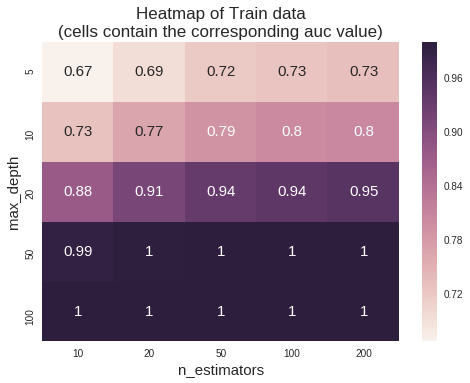

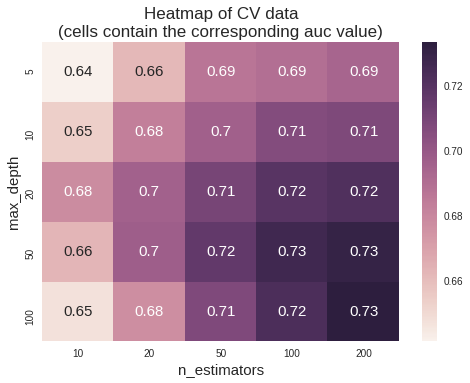

In [0]:
Heatmap(col_names, row_names, train_auc, cv_auc)

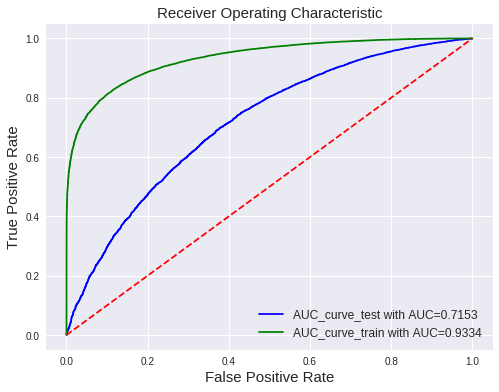

Train confusion matrix
[[ 9775  1774]
 [ 9228 55696]] 




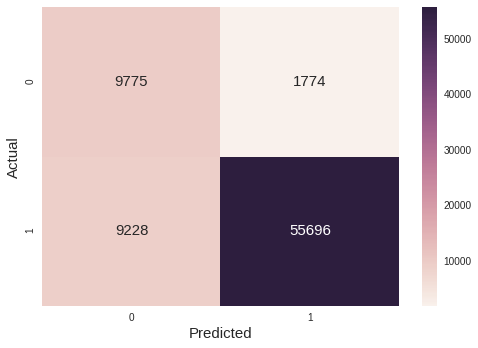

Test confusion matrix
[[ 3034  1959]
 [ 8057 19725]] 




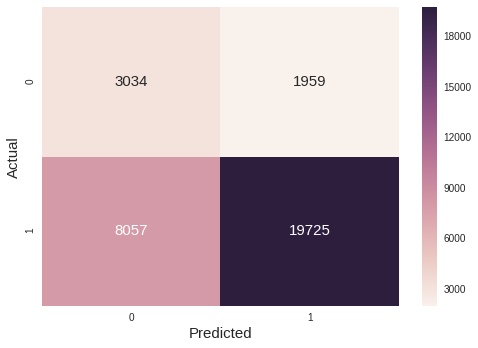

In [127]:
best_depth1, best_n_estimators1 = 20, 100
auc1, auc11 , clf1 = Test_RF(best_n_estimators1, best_depth1, X_test, X_train)

#### 2.2.2 Applying Random Forests on TFIDF

In [128]:
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  hstack((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], title_tfidf_train, text_tfidf_train, price_train, q_train, p_train))


X_test =  hstack((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], title_tfidf_test, text_tfidf_test, price_test, q_test, p_test))

print(X_test.shape)
print(X_train.shape)

(32775, 7612)
(76473, 7612)


In [2]:
col_names, row_names, train_auc, cv_auc = Tune_RF(X_train)

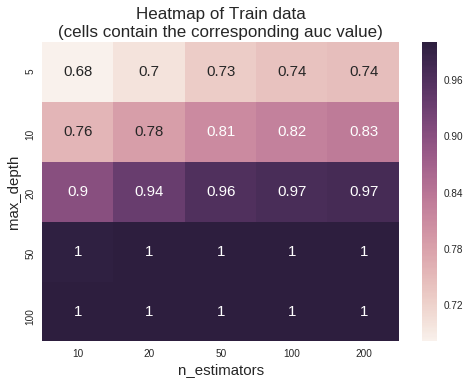

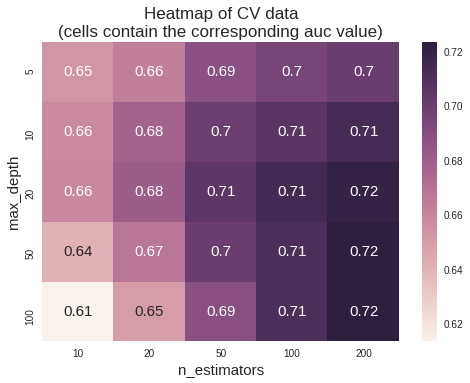

In [0]:
Heatmap(col_names, row_names, train_auc, cv_auc)

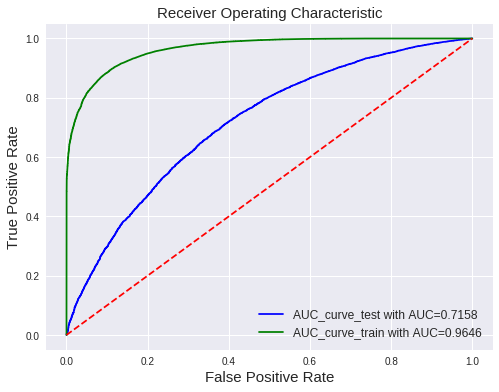

Train confusion matrix
[[ 9610  1939]
 [ 4305 60619]] 




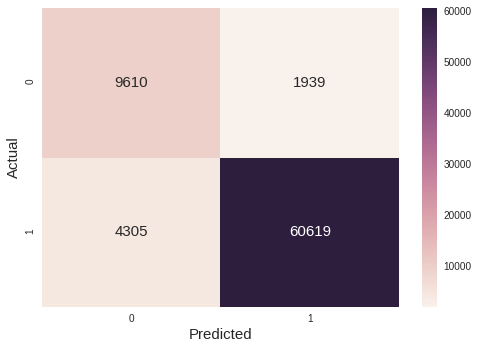

Test confusion matrix
[[ 2388  2605]
 [ 5039 22743]] 




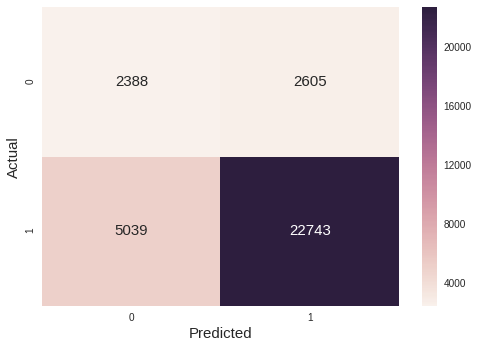

In [133]:
best_depth2, best_n_estimators2 = 20, 200
auc2, auc21 , clf2 = Test_RF(best_n_estimators2, best_depth2, X_test, X_train)

#### 2.2.3 Applying Random Forests on AVG W2V

In [134]:
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  np.concatenate((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], avg_w2v_train1, 
                          avg_w2v_train, price_train, q_train, p_train), axis = 1)


X_test =  np.concatenate((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], avg_w2v_test1, avg_w2v_test,
                  price_test, q_test, p_test), axis = 1)


print(X_test.shape)
print(X_train.shape)

(32775, 113)
(76473, 113)


In [6]:
col_names, row_names, train_auc, cv_auc = Tune_RF(X_train)

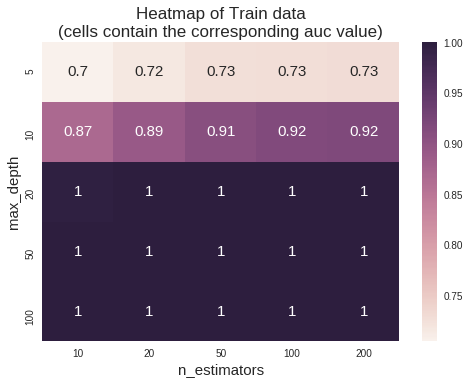

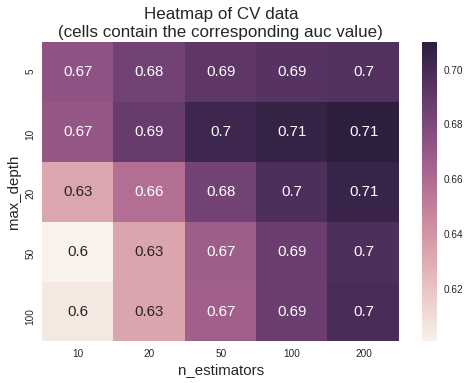

In [0]:
Heatmap(col_names, row_names, train_auc, cv_auc)

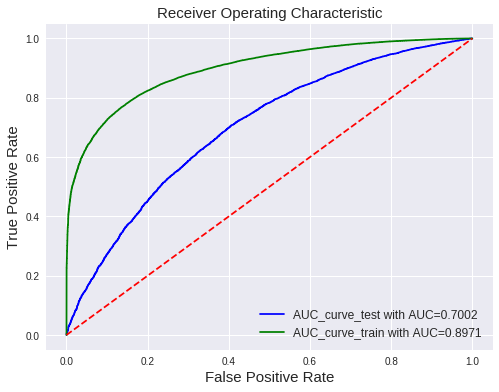

Train confusion matrix
[[ 8633  2916]
 [ 9359 55565]] 




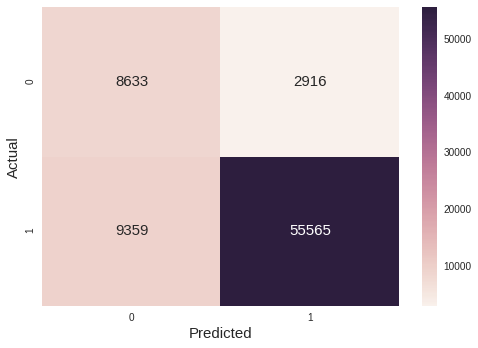

Test confusion matrix
[[ 3067  1926]
 [ 8761 19021]] 




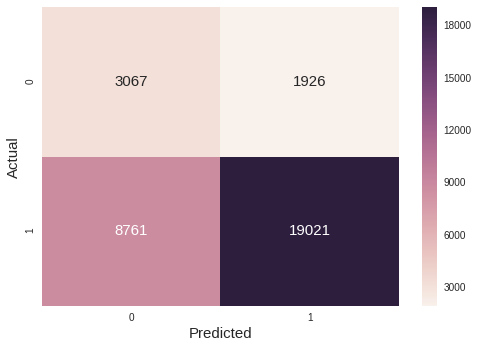

In [135]:
best_depth3, best_n_estimators3 = 10, 100
auc3, auc31 , clf3 = Test_RF(best_n_estimators3, best_depth3, X_test, X_train)

#### 2.2.4 Applying Random Forests on TFIDF W2V

In [136]:
# Please write all the code with proper documentation
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  np.concatenate((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], tfidf_w2v_train1, tfidf_w2v_train,
                           price_train, q_train, p_train), axis = 1)


X_test =  np.concatenate((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], tfidf_w2v_test1, tfidf_w2v_test,
                  price_test, q_test, p_test), axis = 1)


print(X_test.shape)
print(X_train.shape)

(32775, 113)
(76473, 113)


In [5]:
col_names, row_names, train_auc, cv_auc = Tune_RF(X_train)

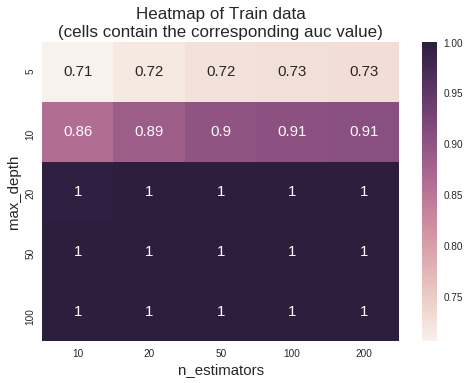

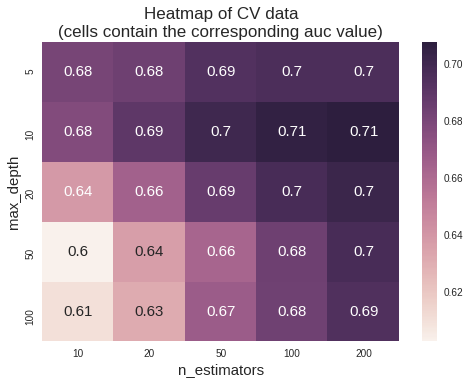

In [0]:
Heatmap(col_names, row_names, train_auc, cv_auc)

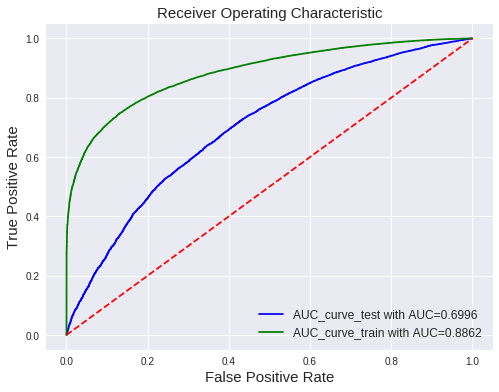

Train confusion matrix
[[ 8850  2699]
 [11386 53538]] 




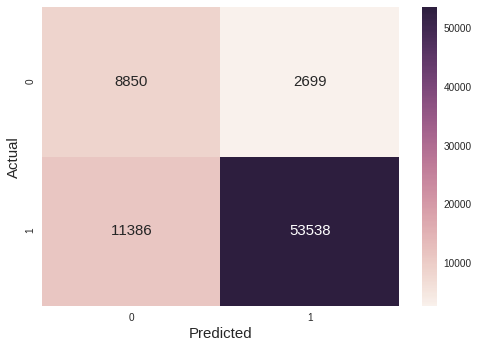

Test confusion matrix
[[ 3107  1886]
 [ 9162 18620]] 




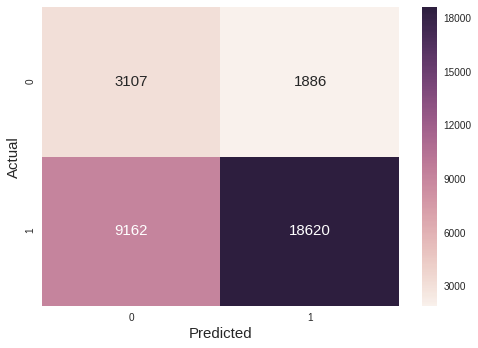

In [137]:
best_depth4, best_n_estimators4 = 10, 100
auc4, auc41 , clf4 = Test_RF(best_n_estimators4, best_depth4, X_test, X_train)

### 2.3 Applying GBDT

#### 2.3.1 Applying XGBOOST on BOW

In [138]:
from scipy.sparse import hstack
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  hstack((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], title_bow_train, text_bow_train, price_train, q_train, p_train))


X_test =  hstack((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], title_bow_test, text_bow_test, price_test, q_test, p_test))

print(X_test.shape)
print(X_train.shape)

(32775, 7612)
(76473, 7612)


In [4]:
col_names, row_names, train_auc, cv_auc = Tune_XGB(X_train)

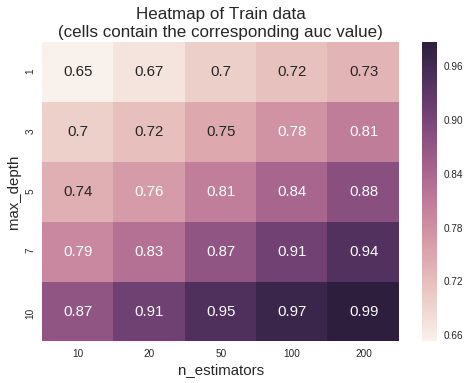

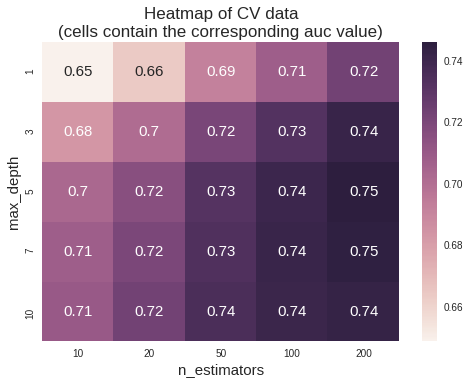

In [84]:
Heatmap(col_names, row_names, train_auc, cv_auc)

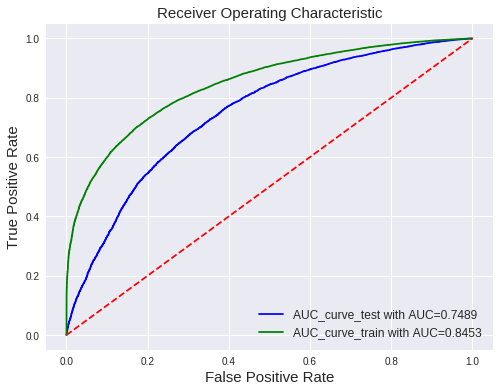

Train confusion matrix
[[ 9655  1894]
 [20189 44735]] 




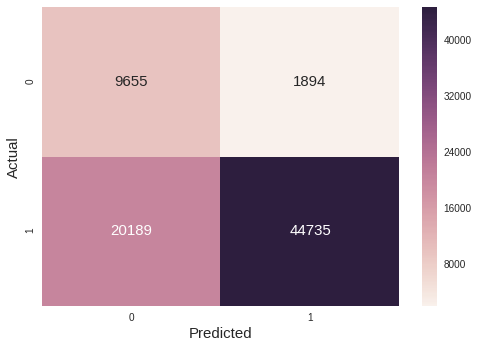

Test confusion matrix
[[ 4405   588]
 [17329 10453]] 




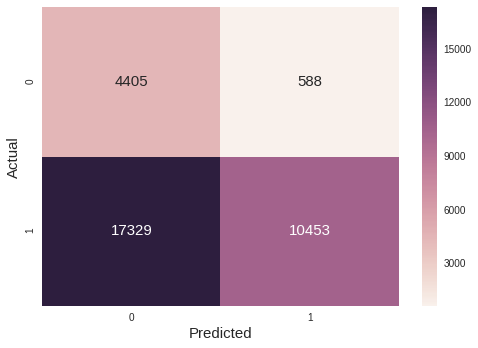

In [139]:
best_depth5, best_n_estimators5 = 5, 200
auc5, auc51 , clf5 = Test_XGB(best_n_estimators5, best_depth5, X_test, X_train)

#### 2.3.2 Applying XGBOOST on TFIDF

In [140]:
from scipy.sparse import hstack
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  hstack((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], title_tfidf_train, text_tfidf_train, price_train, q_train, p_train))


X_test =  hstack((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], title_tfidf_test, text_tfidf_test, price_test, q_test, p_test))

print(X_test.shape)
print(X_train.shape)

(32775, 7612)
(76473, 7612)


In [3]:
col_names, row_names, train_auc, cv_auc = Tune_XGB(X_train)

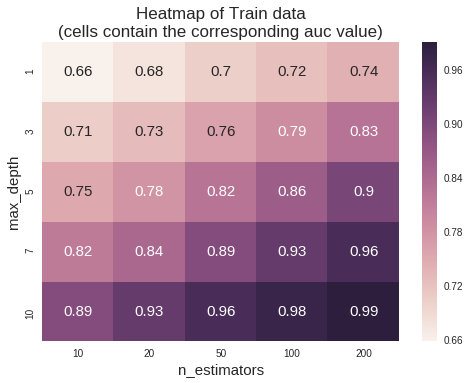

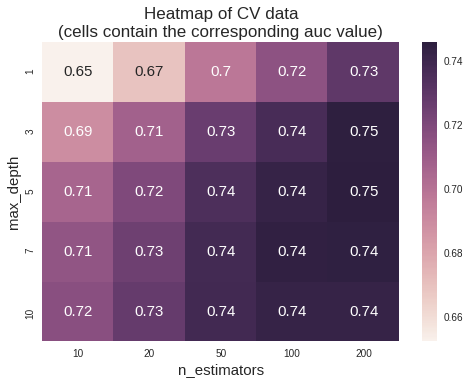

In [84]:
Heatmap(col_names, row_names, train_auc, cv_auc)

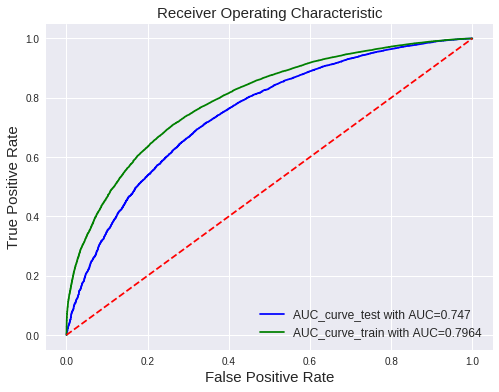

Train confusion matrix
[[ 9148  2401]
 [22932 41992]] 




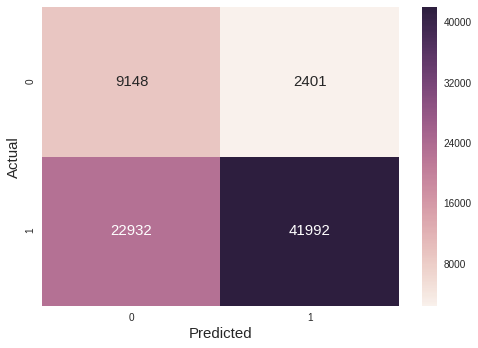

Test confusion matrix
[[ 4556   437]
 [18929  8853]] 




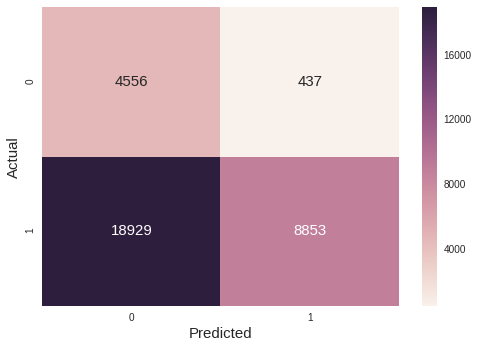

In [141]:
best_depth6, best_n_estimators6 = 3, 200
auc6, auc61 , clf6 = Test_XGB(best_n_estimators6, best_depth6, X_test, X_train)

#### 2.3.3 Applying XGBOOST on AVG W2V

In [142]:
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  np.concatenate((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], avg_w2v_train1, 
                          avg_w2v_train, price_train, q_train, p_train), axis = 1)


X_test =  np.concatenate((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], avg_w2v_test1, avg_w2v_test,
                  price_test, q_test, p_test), axis = 1)


print(X_test.shape)
print(X_train.shape)

(32775, 113)
(76473, 113)


In [2]:
col_names, row_names, train_auc, cv_auc = Tune_XGB(X_train)

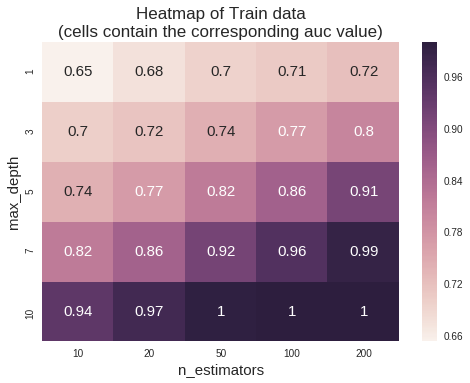

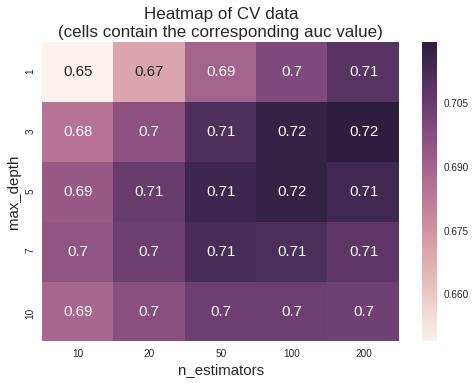

In [88]:
Heatmap(col_names, row_names, train_auc, cv_auc)

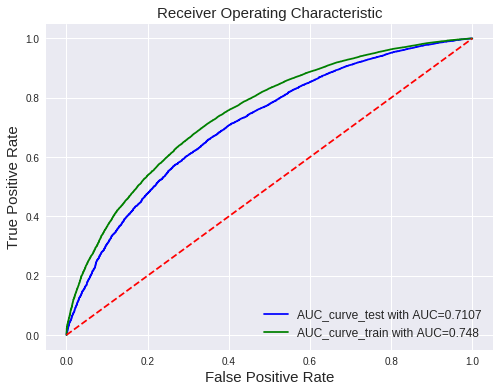

Train confusion matrix
[[ 8692  2857]
 [25975 38949]] 




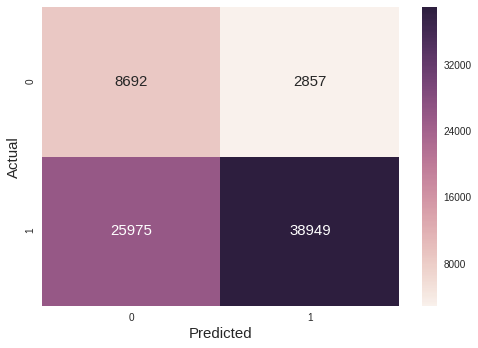

Test confusion matrix
[[ 4618   375]
 [20801  6981]] 




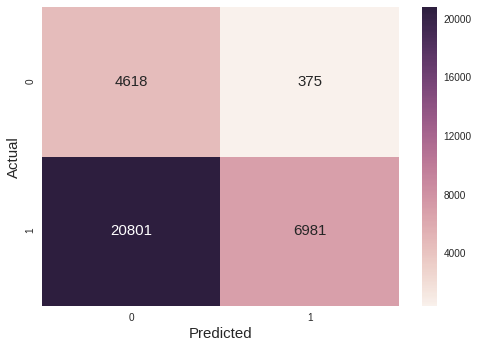

In [143]:
best_depth7, best_n_estimators7 = 3, 100
auc7, auc71 , clf7 = Test_XGB(best_n_estimators7, best_depth7, X_test, X_train)

#### 2.3.4 Applying XGBOOST on TFIDF W2V

In [144]:
# to stack the sparse and numpy array: https://stackoverflow.com/a/38518846
X_train =  np.concatenate((x_train['state_0'][:, None], x_train['state_1'][:, None], x_train['clean_categories_0'][:, None],
                  x_train['clean_categories_1'][:, None], x_train['clean_subcategories_0'][:, None], 
                  x_train['clean_subcategories_1'][:, None], x_train['project_grade_category_0'][:, None],
                  x_train['project_grade_category_1'][:, None], x_train['teacher_prefix_0'][:, None],
                  x_train['teacher_prefix_1'][:, None], tfidf_w2v_train1, tfidf_w2v_train,
                           price_train, q_train, p_train), axis = 1)


X_test =  np.concatenate((x_test['state_0'][:, None], x_test['state_1'][:, None], x_test['clean_categories_0'][:, None],
                  x_test['clean_categories_1'][:, None], x_test['clean_subcategories_0'][:, None], 
                  x_test['clean_subcategories_1'][:, None], x_test['project_grade_category_0'][:, None],
                  x_test['project_grade_category_1'][:, None], x_test['teacher_prefix_0'][:, None],
                  x_test['teacher_prefix_1'][:, None], tfidf_w2v_test1, tfidf_w2v_test,
                  price_test, q_test, p_test), axis = 1)


print(X_test.shape)
print(X_train.shape)

(32775, 113)
(76473, 113)


In [1]:
col_names, row_names, train_auc, cv_auc = Tune_XGB(X_train)

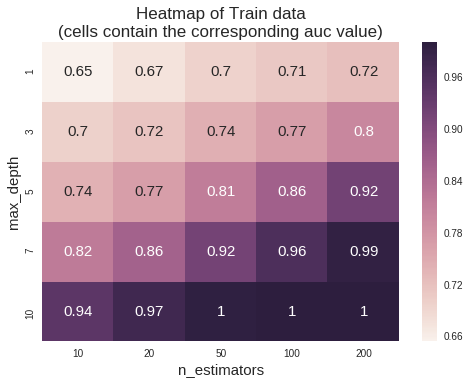

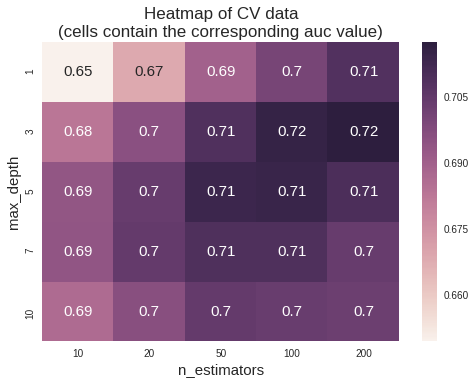

In [92]:
Heatmap(col_names, row_names, train_auc, cv_auc)

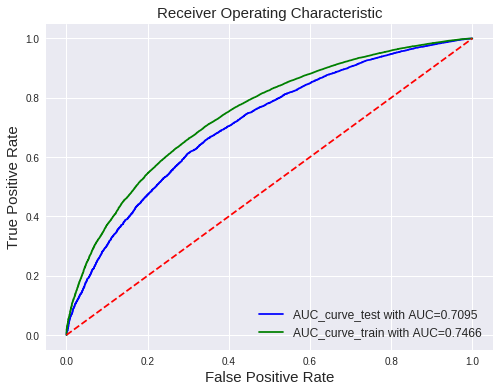

Train confusion matrix
[[ 8769  2780]
 [26221 38703]] 




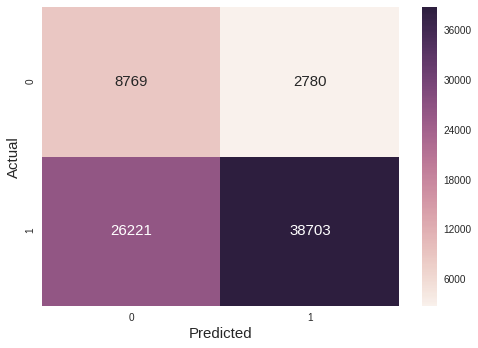

Test confusion matrix
[[ 4585   408]
 [20495  7287]] 




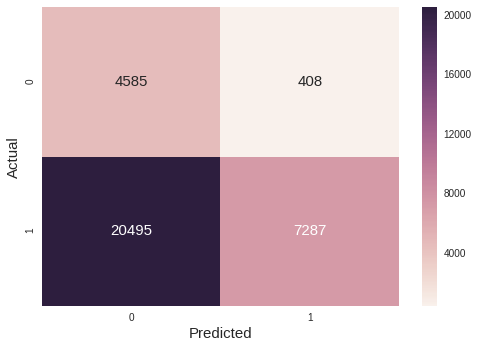

In [187]:
best_depth8, best_n_estimators8 = 3, 100
auc8, auc81 , clf8 = Test_XGB(best_n_estimators8, best_depth8, X_test, X_train)

### 2.4 Conclusion

**<font size = 3>Summary</font>**
* Out of all 8 models,  5th model (GBDT on BoW) has the highest AUC value (=0.7489).
* In RF 2nd model (RF on BoW) is best model beacuse it has AUC value = 0.7158.
* But if we look at the confusion matrix of test and train of RF and GBDT models, we can say that RF models are better than GBDT for this dataset becasue in GBDT models has high AUC value but their performance for class '1' is not good.

In [188]:
# Please compare all your models using Prettytable library
from prettytable import PrettyTable
#If you get a ModuleNotFoundError error , install prettytable using: pip3 install prettytable
x = PrettyTable()
x.field_names = ["Model","Vectorizer", "Best max_depth: hyperparameter","Best n_estimators", "AUC_test", "AUC_train"]

x.add_row(['Random Forest', 'Bow', best_depth1, best_n_estimators1, auc1, auc11])
x.add_row(['Random Forest', 'TF-IDF', best_depth2, best_n_estimators2, auc2, auc21])
x.add_row(['Random Forest', 'Avg W2V',  best_depth3, best_n_estimators3, auc3, auc31])
x.add_row(['Random Forest', 'TF-IDF W2V', best_depth4, best_n_estimators4, auc4, auc41])

x.add_row(['GBDT', 'Bow', best_depth5, best_n_estimators5, auc5, auc51])
x.add_row(['GBDT', 'TF-IDF', best_depth6, best_n_estimators6, auc6, auc61])
x.add_row(['GBDT', 'Avg W2V',  best_depth7, best_n_estimators7, auc7, auc71])
x.add_row(['GBDT', 'TF-IDF W2V', best_depth8, best_n_estimators8, auc8, auc81])

print(x)

+---------------+------------+--------------------------------+-------------------+----------+-----------+
|     Model     | Vectorizer | Best max_depth: hyperparameter | Best n_estimators | AUC_test | AUC_train |
+---------------+------------+--------------------------------+-------------------+----------+-----------+
| Random Forest |    Bow     |               20               |        100        |  0.7153  |   0.9334  |
| Random Forest |   TF-IDF   |               20               |        200        |  0.7158  |   0.9646  |
| Random Forest |  Avg W2V   |               10               |        100        |  0.7002  |   0.8971  |
| Random Forest | TF-IDF W2V |               10               |        100        |  0.6996  |   0.8862  |
|      GBDT     |    Bow     |               5                |        200        |  0.7489  |   0.8453  |
|      GBDT     |   TF-IDF   |               3                |        200        |  0.747   |   0.7964  |
|      GBDT     |  Avg W2V   |       